<a href="https://colab.research.google.com/github/Grover1204/Eye-Gaze-Estimation/blob/main/Rahul_Eye_tracking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#install the Kaggle API Python package
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"grover009","key":"df213bc82f83cd181a0574088199381d"}'}

In [ ]:
!mkdir ~/.kaggle


!cp kaggle.json ~/.kaggle/


!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets list

ref                                                               title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
----------------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
nelgiriyewithana/global-youtube-statistics-2023                   Global YouTube Statistics 2023                      60KB  2023-07-28 15:36:38           7733        250  1.0              
nagrajdesai/latest-10000-movies-dataset-from-tmdb                 Latest 10000 Movies Dataset from TMDB                1MB  2023-08-17 04:45:36            709         31  1.0              
talhabu/us-regional-sales-data                                    US Regional Sales Data                             195KB  2023-08-14 13:37:46            552         25  1.0              
nelgiriyewithana/countries-of-the-world-2023           

In [ ]:
!kaggle datasets download -d 4quant/eye-gaze

100% 4.46G/4.46G [02:38<00:00, 30.8MB/s]
100% 4.46G/4.46G [02:38<00:00, 30.2MB/s]


In [ ]:
! unzip eye-gaze.zip

Streaming output truncated to the last 5000 lines.
  inflating: original/p11/day16/0120.jpg  
  inflating: original/p11/day16/0121.jpg  
  inflating: original/p11/day16/0122.jpg  
  inflating: original/p11/day16/0123.jpg  
  inflating: original/p11/day16/0124.jpg  
  inflating: original/p11/day16/0125.jpg  
  inflating: original/p11/day16/0126.jpg  
  inflating: original/p11/day16/0127.jpg  
  inflating: original/p11/day16/0128.jpg  
  inflating: original/p11/day16/0129.jpg  
  inflating: original/p11/day16/0130.jpg  
  inflating: original/p11/day16/0131.jpg  
  inflating: original/p11/day16/0132.jpg  
  inflating: original/p11/day16/0133.jpg  
  inflating: original/p11/day16/0134.jpg  
  inflating: original/p11/day16/0135.jpg  
  inflating: original/p11/day16/0136.jpg  
  inflating: original/p11/day16/0137.jpg  
  inflating: original/p11/day16/0138.jpg  
  inflating: original/p11/day16/0139.jpg  
  inflating: original/p11/day16/0140.jpg  
  inflating: original/p11/day16/0141.jpg  
  i

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/content/gaze.csv')

In [ ]:
df.head()

,Unnamed: 0,caruncle_2d,eye_details,eye_region_details,head_pose,interior_margin_2d,iris_2d,lighting_details,path,image_path
0,0,"['(215.0031, 192.4742, 8.8517)', '(215.7098, 1...","{'look_vec': '(0.6431, -0.1524, -0.7504, 0.000...","{'pca_shape_coeffs': ['0.0007733516', '-0.0437...","(343.9734, 203.3986, 0.0000)","['(227.0560, 193.6605, 8.9595)', '(226.1751, 1...","['(269.4162, 189.3056, 8.8182)', '(271.0880, 1...","{'light_intensity': '1.185965', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
1,1,"['(223.6765, 162.1306, 8.9962)', '(221.7880, 1...","{'look_vec': '(0.2652, -0.2683, -0.9261, 0.000...","{'pca_shape_coeffs': ['-0.02472504', '0.026948...","(15.2429, 202.4540, 0.0000)","['(234.3076, 169.7990, 8.9854)', '(233.3026, 1...","['(244.1168, 176.3059, 8.8628)', '(244.6292, 1...","{'light_intensity': '1.193954', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
2,2,"['(205.6100, 177.0319, 9.2145)', '(202.6687, 1...","{'look_vec': '(0.1989, 0.2961, -0.9342, 0.0000...","{'pca_shape_coeffs': ['-0.02174765', '-0.00112...","(352.7227, 176.4034, 0.0000)","['(211.9590, 187.5484, 9.2273)', '(208.9760, 1...","['(239.0684, 207.9922, 8.8796)', '(239.3991, 2...","{'light_intensity': '0.9365342', 'ambient_inte...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
3,3,"['(209.6651, 158.9221, 9.2303)', '(206.8911, 1...","{'look_vec': '(0.1647, -0.5925, -0.7885, 0.000...","{'pca_shape_coeffs': ['-0.01105405', '-0.00522...","(11.3983, 190.6636, 0.0000)","['(220.5346, 164.9280, 9.2361)', '(218.8153, 1...","['(239.2941, 160.4984, 9.0569)', '(240.1653, 1...","{'light_intensity': '0.8010478', 'ambient_inte...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
4,4,"['(208.2314, 161.6137, 9.1717)', '(204.2533, 1...","{'look_vec': '(-0.0701, 0.1484, -0.9864, 0.000...","{'pca_shape_coeffs': ['0.04512117', '0.0274486...","(17.7946, 187.9936, 0.0000)","['(220.2793, 174.3996, 9.1287)', '(216.4354, 1...","['(225.7676, 200.2958, 8.9808)', '(226.4593, 2...","{'light_intensity': '0.784719', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...


In [ ]:
len(df)

50000

In [ ]:
import pandas as pd

df = pd.read_csv('gaze.csv')
df.head()


,Unnamed: 0,caruncle_2d,eye_details,eye_region_details,head_pose,interior_margin_2d,iris_2d,lighting_details,path,image_path
0,0,"['(215.0031, 192.4742, 8.8517)', '(215.7098, 1...","{'look_vec': '(0.6431, -0.1524, -0.7504, 0.000...","{'pca_shape_coeffs': ['0.0007733516', '-0.0437...","(343.9734, 203.3986, 0.0000)","['(227.0560, 193.6605, 8.9595)', '(226.1751, 1...","['(269.4162, 189.3056, 8.8182)', '(271.0880, 1...","{'light_intensity': '1.185965', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
1,1,"['(223.6765, 162.1306, 8.9962)', '(221.7880, 1...","{'look_vec': '(0.2652, -0.2683, -0.9261, 0.000...","{'pca_shape_coeffs': ['-0.02472504', '0.026948...","(15.2429, 202.4540, 0.0000)","['(234.3076, 169.7990, 8.9854)', '(233.3026, 1...","['(244.1168, 176.3059, 8.8628)', '(244.6292, 1...","{'light_intensity': '1.193954', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
2,2,"['(205.6100, 177.0319, 9.2145)', '(202.6687, 1...","{'look_vec': '(0.1989, 0.2961, -0.9342, 0.0000...","{'pca_shape_coeffs': ['-0.02174765', '-0.00112...","(352.7227, 176.4034, 0.0000)","['(211.9590, 187.5484, 9.2273)', '(208.9760, 1...","['(239.0684, 207.9922, 8.8796)', '(239.3991, 2...","{'light_intensity': '0.9365342', 'ambient_inte...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
3,3,"['(209.6651, 158.9221, 9.2303)', '(206.8911, 1...","{'look_vec': '(0.1647, -0.5925, -0.7885, 0.000...","{'pca_shape_coeffs': ['-0.01105405', '-0.00522...","(11.3983, 190.6636, 0.0000)","['(220.5346, 164.9280, 9.2361)', '(218.8153, 1...","['(239.2941, 160.4984, 9.0569)', '(240.1653, 1...","{'light_intensity': '0.8010478', 'ambient_inte...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
4,4,"['(208.2314, 161.6137, 9.1717)', '(204.2533, 1...","{'look_vec': '(-0.0701, 0.1484, -0.9864, 0.000...","{'pca_shape_coeffs': ['0.04512117', '0.0274486...","(17.7946, 187.9936, 0.0000)","['(220.2793, 174.3996, 9.1287)', '(216.4354, 1...","['(225.7676, 200.2958, 8.9808)', '(226.4593, 2...","{'light_intensity': '0.784719', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...


In [ ]:
import json

with open('gaze.json', 'r') as file:
    data = json.load(file)

data


{'caruncle_2d': {'0': ['(215.0031, 192.4742, 8.8517)',
   '(215.7098, 198.7790, 8.9220)',
   '(218.2289, 199.8089, 8.9291)',
   '(206.5326, 202.7618, 8.8062)',
   '(207.0680, 200.1248, 8.8324)',
   '(204.7977, 199.1230, 8.7407)',
   '(204.3005, 203.9268, 8.7143)'],
  '1': ['(223.6765, 162.1306, 8.9962)',
   '(221.7880, 166.7997, 8.9936)',
   '(219.1187, 169.0978, 8.9347)',
   '(212.2020, 164.0586, 8.8368)',
   '(214.2369, 162.9324, 8.8932)',
   '(213.6956, 159.6272, 8.8848)',
   '(209.9929, 160.6398, 8.8299)'],
  '2': ['(205.6100, 177.0319, 9.2145)',
   '(202.6687, 181.4165, 9.3002)',
   '(201.3873, 188.5052, 9.2656)',
   '(195.1520, 182.6315, 9.2281)',
   '(196.5371, 180.1527, 9.2259)',
   '(196.8546, 178.1698, 9.1534)',
   '(194.4122, 179.4723, 9.1695)'],
  '3': ['(209.6651, 158.9221, 9.2303)',
   '(206.8911, 167.1358, 9.2324)',
   '(205.9107, 168.0480, 9.2049)',
   '(196.1766, 165.5607, 9.1413)',
   '(198.1069, 164.9294, 9.1870)',
   '(198.0969, 161.8315, 9.1761)',
   '(195.9927, 16

In [ ]:
data

{'caruncle_2d': {'0': ['(215.0031, 192.4742, 8.8517)',
   '(215.7098, 198.7790, 8.9220)',
   '(218.2289, 199.8089, 8.9291)',
   '(206.5326, 202.7618, 8.8062)',
   '(207.0680, 200.1248, 8.8324)',
   '(204.7977, 199.1230, 8.7407)',
   '(204.3005, 203.9268, 8.7143)'],
  '1': ['(223.6765, 162.1306, 8.9962)',
   '(221.7880, 166.7997, 8.9936)',
   '(219.1187, 169.0978, 8.9347)',
   '(212.2020, 164.0586, 8.8368)',
   '(214.2369, 162.9324, 8.8932)',
   '(213.6956, 159.6272, 8.8848)',
   '(209.9929, 160.6398, 8.8299)'],
  '2': ['(205.6100, 177.0319, 9.2145)',
   '(202.6687, 181.4165, 9.3002)',
   '(201.3873, 188.5052, 9.2656)',
   '(195.1520, 182.6315, 9.2281)',
   '(196.5371, 180.1527, 9.2259)',
   '(196.8546, 178.1698, 9.1534)',
   '(194.4122, 179.4723, 9.1695)'],
  '3': ['(209.6651, 158.9221, 9.2303)',
   '(206.8911, 167.1358, 9.2324)',
   '(205.9107, 168.0480, 9.2049)',
   '(196.1766, 165.5607, 9.1413)',
   '(198.1069, 164.9294, 9.1870)',
   '(198.0969, 161.8315, 9.1761)',
   '(195.9927, 16

In [ ]:
import h5py

with h5py.File('gaze.h5', 'r') as file:
    keys = list(file.keys())

keys


['image', 'look_vec', 'path']

In [ ]:
import os

files_in_directory = os.listdir('MPIIGaze')
files_in_directory


['ReadMe.txt',
 'Evaluation Subset',
 'Annotation Subset',
 'Data',
 '6 points-based face model.mat']

# Data Exploring

In [ ]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('gaze.csv')

# Display the first few rows to understand its structure
df_head = df.head()
df_head


,Unnamed: 0,caruncle_2d,eye_details,eye_region_details,head_pose,interior_margin_2d,iris_2d,lighting_details,path,image_path
0,0,"['(215.0031, 192.4742, 8.8517)', '(215.7098, 1...","{'look_vec': '(0.6431, -0.1524, -0.7504, 0.000...","{'pca_shape_coeffs': ['0.0007733516', '-0.0437...","(343.9734, 203.3986, 0.0000)","['(227.0560, 193.6605, 8.9595)', '(226.1751, 1...","['(269.4162, 189.3056, 8.8182)', '(271.0880, 1...","{'light_intensity': '1.185965', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
1,1,"['(223.6765, 162.1306, 8.9962)', '(221.7880, 1...","{'look_vec': '(0.2652, -0.2683, -0.9261, 0.000...","{'pca_shape_coeffs': ['-0.02472504', '0.026948...","(15.2429, 202.4540, 0.0000)","['(234.3076, 169.7990, 8.9854)', '(233.3026, 1...","['(244.1168, 176.3059, 8.8628)', '(244.6292, 1...","{'light_intensity': '1.193954', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
2,2,"['(205.6100, 177.0319, 9.2145)', '(202.6687, 1...","{'look_vec': '(0.1989, 0.2961, -0.9342, 0.0000...","{'pca_shape_coeffs': ['-0.02174765', '-0.00112...","(352.7227, 176.4034, 0.0000)","['(211.9590, 187.5484, 9.2273)', '(208.9760, 1...","['(239.0684, 207.9922, 8.8796)', '(239.3991, 2...","{'light_intensity': '0.9365342', 'ambient_inte...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
3,3,"['(209.6651, 158.9221, 9.2303)', '(206.8911, 1...","{'look_vec': '(0.1647, -0.5925, -0.7885, 0.000...","{'pca_shape_coeffs': ['-0.01105405', '-0.00522...","(11.3983, 190.6636, 0.0000)","['(220.5346, 164.9280, 9.2361)', '(218.8153, 1...","['(239.2941, 160.4984, 9.0569)', '(240.1653, 1...","{'light_intensity': '0.8010478', 'ambient_inte...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...
4,4,"['(208.2314, 161.6137, 9.1717)', '(204.2533, 1...","{'look_vec': '(-0.0701, 0.1484, -0.9864, 0.000...","{'pca_shape_coeffs': ['0.04512117', '0.0274486...","(17.7946, 187.9936, 0.0000)","['(220.2793, 174.3996, 9.1287)', '(216.4354, 1...","['(225.7676, 200.2958, 8.9808)', '(226.4593, 2...","{'light_intensity': '0.784719', 'ambient_inten...",..\..\..\..\Downloads\UnityEyes_Windows\UnityE...,..\..\..\..\Downloads\UnityEyes_Windows\UnityE...


In [ ]:
import json

# Load the JSON data
with open('gaze.json', 'r') as file:
    json_data = json.load(file)

# Display the keys to understand its structure
json_keys = json_data.keys()
json_keys


dict_keys(['caruncle_2d', 'eye_details', 'eye_region_details', 'head_pose', 'interior_margin_2d', 'iris_2d', 'lighting_details', 'path', 'image_path'])

In [ ]:
import h5py

# Open the HDF5 file and check the type of the "image" entry
with h5py.File('gaze.h5', 'r') as file:
    hdf5_keys = list(file.keys())
    image_entry_type = type(file['image'])

hdf5_keys, image_entry_type


(['image', 'look_vec', 'path'], h5py._hl.group.Group)

In [ ]:
import h5py

# Open the HDF5 file and list the contents of the "image" group
with h5py.File('gaze.h5', 'r') as file:
    image_group_keys = list(file['image'].keys())

image_group_keys


['..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\1.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\100.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\1000.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10000.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10001.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10002.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10003.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10004.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10005.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10006.jpg',
 '..\\..\\..\\..\\Downloads\\UnityEyes_Windows\\UnityEyes_Windows\\imgs\\10

In [ ]:
%ls

eye-gaze.zip  gaze.h5    kaggle.json  MPIIGaze/    original/     sample_data/
gaze.csv      gaze.json  mpiigaze/    normalized/  real_gaze.h5


In [ ]:
import os

# List the contents of the MPIIGaze directory as an example
mpiigaze_contents = os.listdir('MPIIGaze')
mpiigaze_contents


['ReadMe.txt',
 'Evaluation Subset',
 'Annotation Subset',
 'Data',
 '6 points-based face model.mat']

In [ ]:
import os

# List the contents of the MPIIGaze directory as an example
mpiigaze_2 = os.listdir('/content/mpiigaze')
mpiigaze_2


['ReadMe.txt', 'Evaluation Subset', 'Annotation Subset', 'Data']

In [ ]:
nomalization = os.listdir('/content/normalized')
nomalization


['p00',
 'p08',
 'p07',
 'p12',
 'p03',
 'p10',
 'p04',
 'p09',
 'p11',
 'p13',
 'p02',
 'p06',
 'p05',
 'p14',
 'p01']

In [ ]:
original = os.listdir('/content/original')
original

['p00',
 'p08',
 'p07',
 'p12',
 'p03',
 'p10',
 'p04',
 'p09',
 'p11',
 'p13',
 'p02',
 'p06',
 'p05',
 'p14',
 'p01']

In [ ]:
from PIL import Image

# Define the path to the first image in the p00 folder
p00_subfolders = os.listdir('/content/original/p00')
first_image_path = os.path.join('/content/original/p00', p00_subfolders[0], os.listdir(os.path.join('/content/original/p01', p00_subfolders[10]))[10])

# Load and display the image
sample_image = Image.open(first_image_path)
sample_image.show()


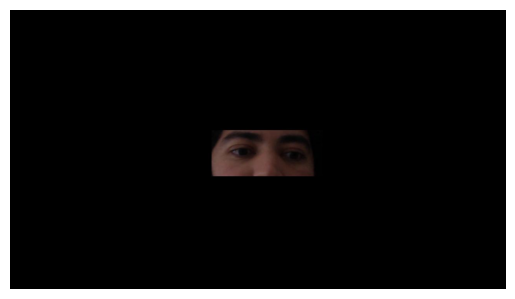

In [ ]:
import matplotlib.pyplot as plt

# Display the sample image using matplotlib
plt.imshow(sample_image)
plt.axis('off')  # Hide the axis values
plt.show()


In [ ]:
# import os
# import numpy as np
# from PIL import Image
# from sklearn.model_selection import train_test_split

# # Load images and labels
# images = []
# labels = []  # For simplicity, let's use folder names as labels
# base_path = '/content/original'

# for folder in os.listdir(base_path):
#     folder_path = os.path.join(base_path, folder)
#     for subfolder in os.listdir(folder_path):
#         subfolder_path = os.path.join(folder_path, subfolder)
#         for img_name in os.listdir(subfolder_path):
#             # Only process files with these extensions
#             if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
#                 img_path = os.path.join(subfolder_path, img_name)
#                 img = Image.open(img_path).convert('L')  # Convert to grayscale
#                 img = img.resize((64, 64))  # Resize to a smaller dimension
#                 images.append(np.array(img))
#                 labels.append(folder)

# # Convert to numpy arrays
# images = np.array(images) / 255.0  # Normalize to [0, 1]
# labels = np.array(labels)

# # Split into training and validation sets
# X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)


In [ ]:
print(len(X_train), len(X_val), len(y_train), len(y_val))

NameError: ignored

In [ ]:

original_contents = os.listdir('original')
original_contents

['p00',
 'p08',
 'p07',
 'p12',
 'p03',
 'p10',
 'p04',
 'p09',
 'p11',
 'p13',
 'p02',
 'p06',
 'p05',
 'p14',
 'p01']

In [ ]:
p00_contents = os.listdir('original/p00')
p00_contents

['day37',
 'day09',
 'day11',
 'day32',
 'day20',
 'day03',
 'day35',
 'day22',
 'day15',
 'day38',
 'day27',
 'day01',
 'day33',
 'day10',
 'day28',
 'day19',
 'day23',
 'day30',
 'day07',
 'day12',
 'day26',
 'day31',
 'day36',
 'day05',
 'day04',
 'day18',
 'day06',
 'day25',
 'day39',
 'day29',
 'day08',
 'day21',
 'day16',
 'day24',
 'day14',
 'day02',
 'day34',
 'day17',
 'day13']

In [ ]:
import os
from PIL import Image

def load_images_from_directory(directory_path):
    """
    Load all images from a specified directory into a list.

    Args:
    - directory_path (str): Path to the directory containing images.

    Returns:
    - List of PIL Image objects.
    """
    image_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    images = [Image.open(os.path.join(directory_path, image_file)) for image_file in image_files]

    return images

# Example usage:
directory_path = "/path/to/your/directory"  # Replace this with the path to your image directory
all_images = load_images_from_directory(directory_path)


FileNotFoundError: ignored

In [ ]:
def load_images_from_directory(directory_path):
    """
    Load all images from a specified directory into a list.

    Args:
    - directory_path (str): Path to the directory containing images.

    Returns:
    - List of PIL Image objects.
    """
    # Allowed image extensions
    allowed_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']

    # Filter files based on allowed extensions
    image_files = [f for f in os.listdir(directory_path)
                   if os.path.isfile(os.path.join(directory_path, f))
                   and os.path.splitext(f)[1].lower() in allowed_extensions]

    images = [Image.open(os.path.join(directory_path, image_file)) for image_file in image_files]

    return images


# Adjusting the directory path for this platform
directory_path_adjusted = "/content/original/p00/day01"
all_images_adjusted = load_images_from_directory(directory_path_adjusted)

# Return the number of images loaded for confirmation
len(all_images_adjusted)


995

In [ ]:
def load_images_from_directory(directory_path):
    """
    Load all images from a specified directory into a list.

    Args:
    - directory_path (str): Path to the directory containing images.

    Returns:
    - List of PIL Image objects.
    """
    # Allowed image extensions
    allowed_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']

    # Filter files based on allowed extensions
    image_files = [f for f in os.listdir(directory_path)
                   if os.path.isfile(os.path.join(directory_path, f))
                   and os.path.splitext(f)[1].lower() in allowed_extensions]

    images = [Image.open(os.path.join(directory_path, image_file)) for image_file in image_files]

    return images

def load_images_from_subdirectories(main_directory):
    """
    Load all images from specified subdirectories of the main directory.

    Args:
    - main_directory (str): Path to the main directory containing subdirectories.

    Returns:
    - List of PIL Image objects.
    """
    all_images = []

    # Loop through day01 to day31
    for day in range(1, 39):
        subdirectory_name = f"day{day:02}"  # Formats day as "day01", "day02", etc.
        subdirectory_path = os.path.join(main_directory, subdirectory_name)

        # Check if subdirectory exists
        if os.path.exists(subdirectory_path):
            images_in_subdirectory = load_images_from_directory(subdirectory_path)
            all_images.extend(images_in_subdirectory)

    return all_images

# The directory paths provided are specific to your environment,
# so running the code here will raise an error due to the paths not existing on this platform.
# You can run this code in your environment where the paths exist.
# Uncomment the lines below to run in your environment.

all_directories = [f"/content/original/p{i:02}" for i in range(3)]  # This will create ['/content/original/p00', '/content/original/p01', '/content/original/p02']

all_images = []

for directory in all_directories:
    images_from_current_dir = load_images_from_subdirectories(directory)
    all_images.extend(images_from_current_dir)

len(all_images)


68973

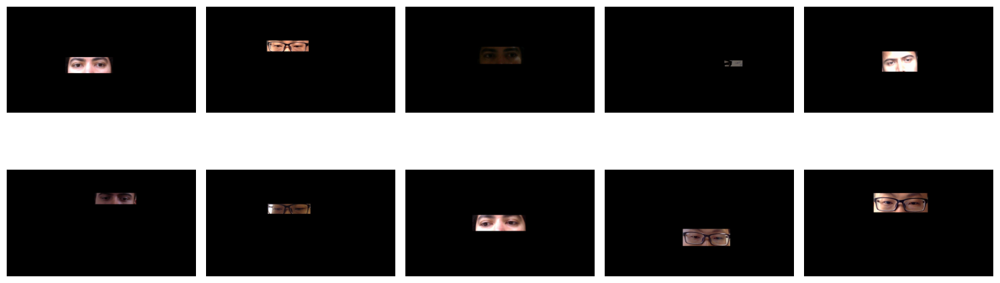

In [ ]:
import random
import matplotlib.pyplot as plt

# Randomly sample 10 images
sample_images = random.sample(all_images, 4)

# Plot the 10 random images
fig, axes = plt.subplots(2, 2, figsize=(15, 6))

for ax, img in zip(axes.ravel(), sample_images):
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()


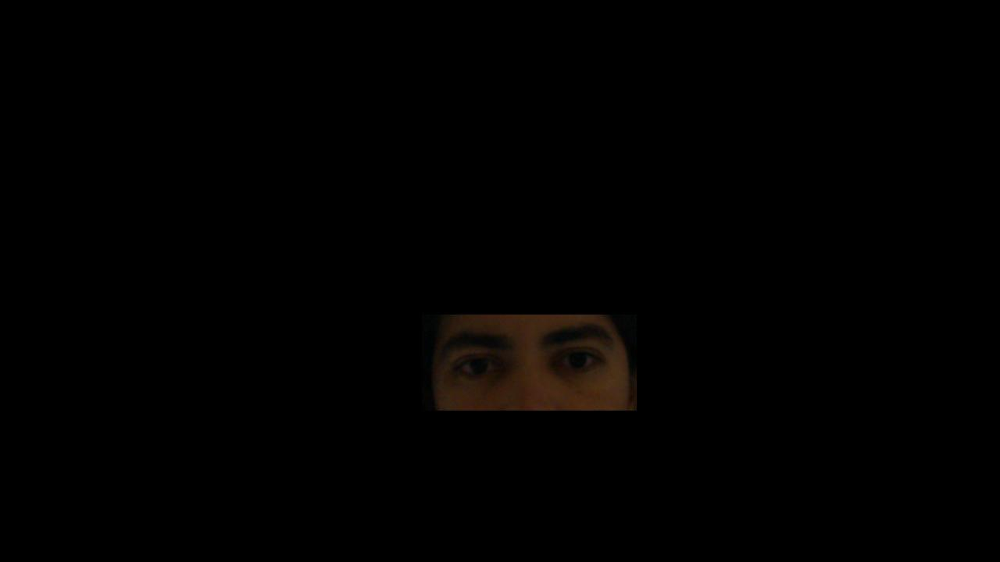

In [ ]:
all_images[1]

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Detecting Eyes
def detect_eyes(img, face_cascade, eye_cascade):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5)

    for (x,y,w,h) in faces:
        roi_gray = gray[y:y+h, x:x+w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        return eyes

# 2. Estimating Gaze Direction (simplified for demonstration)
def get_gaze_direction(eye):
    # Here we'll use a very simplified method:
    # If the eye white is more to the left, we'll say the gaze is left and vice versa.
    # This is a placeholder for more advanced methods.
    eye_gray = cv2.cvtColor(eye, cv2.COLOR_BGR2GRAY)
    _, thresholded = cv2.threshold(eye_gray, 70, 255, cv2.THRESH_BINARY)

    left_white = np.sum(thresholded[:, :thresholded.shape[1]//2])
    right_white = np.sum(thresholded[:, thresholded.shape[1]//2:])

    if left_white > right_white:
        return "left"
    else:
        return "right"

# 3. Pinpointing Location (simplified for demonstration)
def pinpoint_location(img, gaze_direction):
    # Here we'll draw an arrow to the left or right side of the image
    h, w, _ = img.shape
    if gaze_direction == "left":
        end_point = (0, h//2)
    else:
        end_point = (w, h//2)

    img = cv2.arrowedLine(img, (w//2, h//2), end_point, (0,0,255), 2)
    return img

# Load cascades
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

img = cv2.imread('path_to_image.jpg')  # Use your image path
eyes = detect_eyes(img, face_cascade, eye_cascade)

for (ex,ey,ew,eh) in eyes:
    eye = img[ey:ey+eh, ex:ex+ew]
    gaze_direction = get_gaze_direction(eye)
    img = pinpoint_location(img, gaze_direction)

# Display
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()


error: ignored

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load Haar cascades for face and eye detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')


In [ ]:
def detect_eyes(image):
    gray = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x,y,w,h) in faces:
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = np.array(image)[y:y+h, x:x+w]
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex,ey,ew,eh) in eyes:
            cv2.rectangle(roi_color, (ex,ey), (ex+ew,ey+eh), (255,0,0), 2)
    return image


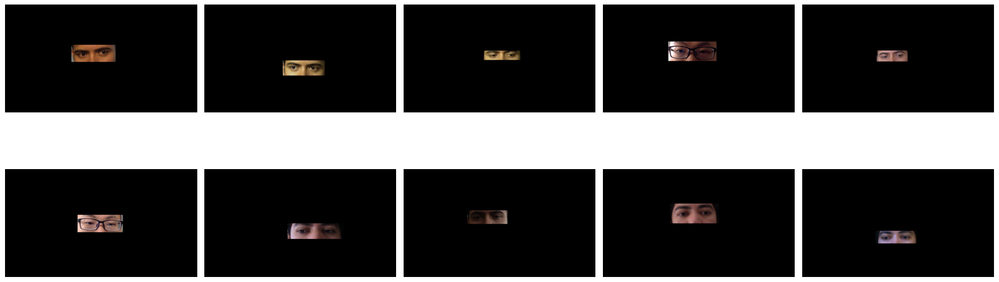

In [ ]:
import random

# Randomly select 10 images
random_samples = random.sample(all_images, 10)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for ax, image in zip(axes.ravel(), random_samples):
    image_with_eyes = detect_eyes(image)
    ax.imshow(image_with_eyes)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Assuming X_train is your preprocessed eye image data and y_train is the gaze direction labels
# X_train shape: (num_samples, height, width, channels)
# y_train shape: (num_samples, 2) - could be (pitch, yaw) or (x, y) offsets, depending on your labeling

# Define a simple CNN model
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], X_train.shape[3])),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(2)  # Predicting 2 values: pitch and yaw (or x,y offsets)
])

model.compile(optimizer='adam', loss='mean_squared_error')

model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)



NameError: ignored

In [ ]:
import numpy as np
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split

# 1. Data Preprocessing

def preprocess_image(img):
    # Convert PIL Image to numpy array
    img = np.array(img)

    # Ensure 3 channels (RGB)
    if img.ndim == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # Resize
    img = cv2.resize(img, (60, 36))

    # Normalize
    img = img / 255.0
    return img


def preprocess_images(image_list):
    return np.array([preprocess_image(img) for img in image_list])

def get_look_vectors(df):
    # Assuming look_vec is a string representation of a tuple
    look_vectors = df['look_vec'].apply(lambda x: eval(x))
    return np.array([np.array(vec) for vec in look_vectors])

X = preprocess_images(all_images)
y = get_look_vectors(df)

# Splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Model Architecture

model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(36, 60, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(4)  # Predicting 4 values for the look vector
])

model.compile(optimizer='adam', loss='mse')

# 3. Training

model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))

# Save the model if needed
# model.save('eye_gaze_model.h5')


In [ ]:
import numpy as np
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split


In [ ]:
import gc
gc.collect()


73

In [ ]:
def preprocess_image(img):
    # Convert PIL Image to numpy array
    img = np.array(img)

    # Ensure 3 channels (RGB)
    if img.ndim == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    # Resize
    img = cv2.resize(img, (60, 36))

    # Normalize
    img = img / 255.0
    return img

def preprocess_images(image_list):
    processed_images = []
    for idx, img in enumerate(image_list):
        try:
            processed_img = preprocess_image(img)
            processed_images.append(processed_img)
        except Exception as e:
            print(f"Error processing image at index {idx}: {e}")
    return np.array(processed_images)



In [ ]:
def get_look_vectors(df):
    # Assuming look_vec is a string representation of a tuple
    look_vectors = df['look_vec'].apply(lambda x: eval(all))
    return np.array([np.array(vec) for vec in look_vectors])


In [ ]:
X = all_images
y = get_look_vectors(df)

# Splitting data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


KeyError: ignored

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(36, 60, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(4)  # Predicting 4 values for the look vector
])

model.compile(optimizer='adam', loss='mse')


In [ ]:
model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test))


In [ ]:
from PIL import Image
import os
import random

BASE_PATH = "/content/MPIIGaze/Data/Original"
participants = ['p{:02d}'.format(i) for i in range(15)]

all_images = []
all_image_paths = []
selected_indices = []  # Store the indices of selected images

for participant in participants:
    participant_path = os.path.join(BASE_PATH, participant)
    day_folders = [d for d in os.listdir(participant_path) if d.startswith('day')]

    for day in day_folders:
        day_path = os.path.join(participant_path, day)
        image_files = [f for f in os.listdir(day_path) if f.endswith('.jpg')]

        indices = list(range(len(image_files)))
        random.shuffle(indices)
        selected = indices[:int(0.2 * len(indices))]

        for idx in selected:
            image_file = image_files[idx]
            image_path = os.path.join(day_path, image_file)
            image = Image.open(image_path)

            all_images.append(image)
            all_image_paths.append(image_path)
            selected_indices.append(idx)

print(f"Loaded {len(all_images)} images.")


Loaded 42595 images.


In [ ]:
import os
import scipy.io

BASE_PATH = "/content/MPIIGaze/Data/Normalized"
participants = ['p{:02d}'.format(i) for i in range(15)]

all_gaze_data = []

for participant in participants:
    participant_path = os.path.join(BASE_PATH, participant)
    day_files = [f for f in os.listdir(participant_path) if f.startswith('day') and f.endswith('.mat')]

    for day_file in day_files:
        day_path = os.path.join(participant_path, day_file)
        mat_data = scipy.io.loadmat(day_path)

        # Process the loaded mat_data as needed for your task
        # For example, you can access specific variables using mat_data['variable_name']
        # and organize the data into a suitable format

        all_gaze_data.append(mat_data)

print(f"Loaded {len(all_gaze_data)} .mat files.")


Loaded 521 .mat files.


In [ ]:
import numpy as np

In [ ]:
import os
from PIL import ImageEnhance, ImageOps

TARGET_SIZE = (224, 224)
BATCH_SIZE = 500
TEMP_DIR = "/content/processed_images"

# Ensure the temporary directory exists
if not os.path.exists(TEMP_DIR):
    os.makedirs(TEMP_DIR)

def process_and_save_batch(image_paths, start_index):
    for idx, image_path in enumerate(image_paths):
        img = Image.open(image_path)

        # Resize
        img = img.resize(TARGET_SIZE)

        # Normalize
        np_img = np.array(img) / 255.0
        img = Image.fromarray((np_img * 255).astype(np.uint8))

        # Save the processed image
        img.save(os.path.join(TEMP_DIR, f"processed_{start_index + idx}.jpg"))

        # Augment and save
        img.rotate(10).save(os.path.join(TEMP_DIR, f"rotated_10_{start_index + idx}.jpg"))
        img.rotate(-10).save(os.path.join(TEMP_DIR, f"rotated_minus_10_{start_index + idx}.jpg"))
        ImageOps.mirror(img).save(os.path.join(TEMP_DIR, f"mirrored_{start_index + idx}.jpg"))

# Process and save images in batches
for i in range(0, len(all_image_paths), BATCH_SIZE):
    process_and_save_batch(all_image_paths[i:i+BATCH_SIZE], i)

print(f"Processed and saved images to {TEMP_DIR}.")


Processed and saved images to /content/processed_images.


In [ ]:
from PIL import Image
import os

# Directory where processed images are saved
DIR_PATH = "/content/processed_images"

# List to store loaded images
loaded_images = []

# List to store image paths (optional, but can be useful)
loaded_image_paths = []

# Load images from the directory
for image_file in os.listdir(DIR_PATH):
    if image_file.endswith('.jpg'):
        image_path = os.path.join(DIR_PATH, image_file)
        img = Image.open(image_path)
        loaded_images.append(img)
        loaded_image_paths.append(image_path)

print(f"Loaded {len(loaded_images)} images from {DIR_PATH}.")


Loaded 170380 images from /content/processed_images.


In [ ]:
import scipy.io

# Load a single .mat file for exploration
sample_mat_file = all_gaze_data[0]

# Print the keys in the .mat file
print(sample_mat_file.keys())

# Once we know the keys, we can access the data we need.
# For demonstration purposes, let's assume there's a key called 'gaze' which contains the gaze data:
# gaze_data = sample_mat_file['gaze']

# However, the exact key will depend on the structure of your .mat files.

dict_keys(['__header__', '__version__', '__globals__', 'data', 'filenames'])


In [ ]:
# Explore the 'data' key
print("Data type:", type(sample_mat_file['data']))
print("Data shape:", sample_mat_file['data'].shape)

# Assuming 'data' is a numpy array or similar, print the first few entries
print("First few data entries:", sample_mat_file['data'][:5])

# Explore the 'filenames' key
print("Filenames type:", type(sample_mat_file['filenames']))
print("Filenames shape:", sample_mat_file['filenames'].shape)

# Print the first few filenames
print("First few filenames:", sample_mat_file['filenames'][:5])


Data type: <class 'numpy.ndarray'>
Data shape: (1, 1)
First few data entries: [[(array([[(array([[ 0.02043722,  0.15716701, -0.98736055],
                 [ 0.04301622,  0.02566337, -0.99874471],
                 [ 0.12880966,  0.18254736, -0.9747228 ],
                 ...,
                 [ 0.11192404,  0.17099133, -0.97889477],
                 [-0.09246777,  0.12611764, -0.98769634],
                 [ 0.189432  ,  0.15731845, -0.96920917]]), array([[[221, 227, 237, ..., 184, 204, 211],
                  [224, 232, 239, ..., 168, 184, 201],
                  [232, 237, 242, ..., 155, 178, 191],
                  ...,
                  [217, 213, 211, ..., 187, 195, 206],
                  [221, 218, 217, ..., 198, 209, 213],
                  [223, 221, 217, ..., 208, 215, 218]],

                 [[203, 206, 212, ..., 189, 194, 201],
                  [204, 214, 216, ..., 183, 198, 203],
                  [210, 220, 228, ..., 176, 186, 201],
                  ...,
               

In [ ]:
# Load a single .mat file for exploration
sample_mat_file = all_gaze_data[0]['data'][0][0]

# Print the dtype names in the data field
print(sample_mat_file.dtype.names)


('right', 'left')


In [ ]:
# Explore the 'right' subfield
right_subfield = sample_mat_file['right']
print("Right subfield type:", type(right_subfield))
print("Right subfield shape:", right_subfield.shape)
print("Right subfield dtype names:", right_subfield.dtype.names)

# Explore the 'left' subfield
left_subfield = sample_mat_file['left']
print("\nLeft subfield type:", type(left_subfield))
print("Left subfield shape:", left_subfield.shape)
print("Left subfield dtype names:", left_subfield.dtype.names)


Right subfield type: <class 'numpy.ndarray'>
Right subfield shape: (1, 1)
Right subfield dtype names: ('gaze', 'image', 'pose')

Left subfield type: <class 'numpy.ndarray'>
Left subfield shape: (1, 1)
Left subfield dtype names: ('gaze', 'image', 'pose')


In [ ]:
# Initialize lists to store gaze data, filenames, and eye (right or left)
all_gaze_vectors = []
all_filenames = []
all_eyes = []

for mat_file in all_gaze_data:
    # Extract gaze vectors, filenames, and eye type
    for eye in ['right', 'left']:
        gaze_vectors = mat_file['data'][0][0][eye]['gaze'][0][0]
        filenames = mat_file['filenames']

        # Flatten the gaze vectors and filenames
        flattened_gaze = [vec[0] for vec in gaze_vectors]
        flattened_filenames = [fname[0][0] for fname in filenames]

        all_gaze_vectors.extend(flattened_gaze)
        all_filenames.extend(flattened_filenames)
        all_eyes.extend([eye] * len(flattened_gaze))

print("Extracted gaze data for", len(all_gaze_vectors), "images.")


Extracted gaze data for 427316 images.


In [ ]:
# Step 1: Create a dictionary with filenames as keys and gaze vectors as values
gaze_dict = {filename: gaze for filename, gaze in zip(all_filenames, all_gaze_vectors)}

# Lists to store paired image paths and gaze vectors
paired_image_paths = []
paired_gaze_vectors = []

# Step 2: Loop through processed image paths and pair with gaze vectors
for image_path in all_image_paths:
    # Extract the filename from the image path
    filename = os.path.basename(image_path)

    # Match the filename with the gaze dictionary
    if filename in gaze_dict:
        paired_image_paths.append(image_path)
        paired_gaze_vectors.append(gaze_dict[filename])
    # Account for augmented images (if you have changed their filenames during augmentation)
    # For example, for rotated images:
    elif "rotated_10_" + filename in gaze_dict:
        paired_image_paths.append(image_path)
        paired_gaze_vectors.append(gaze_dict["rotated_10_" + filename])
    elif "rotated_minus_10_" + filename in gaze_dict:
        paired_image_paths.append(image_path)
        paired_gaze_vectors.append(gaze_dict["rotated_minus_10_" + filename])
    elif "mirrored_" + filename in gaze_dict:
        paired_image_paths.append(image_path)
        paired_gaze_vectors.append(gaze_dict["mirrored_" + filename])

print(f"Paired {len(paired_image_paths)} images with their gaze vectors.")


Paired 42595 images with their gaze vectors.


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into 70% training and 30% temporary (which will be further split into validation and test sets)
train_image_paths, temp_image_paths, train_gaze_vectors, temp_gaze_vectors = train_test_split(
    paired_image_paths, paired_gaze_vectors, test_size=0.3, random_state=42
)

# Split the temporary set into validation and test sets (50% each of the temp set)
val_image_paths, test_image_paths, val_gaze_vectors, test_gaze_vectors = train_test_split(
    temp_image_paths, temp_gaze_vectors, test_size=0.5, random_state=42
)

print(f"Training set size: {len(train_image_paths)} images")
print(f"Validation set size: {len(val_image_paths)} images")
print(f"Test set size: {len(test_image_paths)} images")


Training set size: 29816 images
Validation set size: 6389 images
Test set size: 6390 images


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into 70% training and 30% temporary (which will be further split into validation and test sets)
train_image_paths, temp_image_paths, train_gaze_vectors, temp_gaze_vectors = train_test_split(
    paired_image_paths, paired_gaze_vectors, test_size=0.3, random_state=42
)

# Split the temporary set into validation and test sets (50% each of the temp set)
val_image_paths, test_image_paths, val_gaze_vectors, test_gaze_vectors = train_test_split(
    temp_image_paths, temp_gaze_vectors, test_size=0.5, random_state=42
)

print(f"Training set size: {len(train_image_paths)} images")
print(f"Validation set size: {len(val_image_paths)} images")
print(f"Test set size: {len(test_image_paths)} images")

# Define the data generator
def data_generator(image_paths, gaze_vectors, batch_size):
    while True:
        # Randomly shuffle the indices
        idx = np.random.permutation(len(image_paths))
        num_batches = len(image_paths) // batch_size

        for batch_num in range(num_batches):
            batch_indices = idx[batch_size*batch_num : batch_size*(batch_num+1)]
            batch_image_paths = [image_paths[i] for i in batch_indices]
            batch_gaze_vectors = [gaze_vectors[i] for i in batch_indices]

            # Load and preprocess images
            X = np.array([np.array(Image.open(img_path).convert('L'), dtype=np.float32) / 255.0 for img_path in batch_image_paths])
            y = np.array(batch_gaze_vectors, dtype=np.float32)

            # Expand dimensions to match the input shape
            X = np.expand_dims(X, axis=-1)

            yield (X, y)

# Create data generators
batch_size = 32
train_gen = data_generator(train_image_paths, train_gaze_vectors, batch_size)
val_gen = data_generator(val_image_paths, val_gaze_vectors, batch_size)
test_gen = data_generator(test_image_paths, test_gaze_vectors, batch_size)

# Define the model architecture (you can modify this as needed)
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(128, 128, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(2, activation='linear'))  # Assuming gaze vector is a 2D vector

# Compile the model
model.compile(optimizer='adam', loss='mse')  # Using mean squared error as the loss function for regression

# Train the model
steps_per_epoch = len(train_image_paths) // batch_size
validation_steps = len(val_image_paths) // batch_size

history = model.fit(train_gen,
                    steps_per_epoch=steps_per_epoch,
                    epochs=10,
                    validation_data=val_gen,
                    validation_steps=validation_steps)

# Evaluate the model on the test set
test_steps = len(test_image_paths) // batch_size
test_loss = model.evaluate(test_gen, steps=test_steps)
print(f"Test Loss: {test_loss}")


Training set size: 29816 images
Validation set size: 6389 images
Test set size: 6390 images
Epoch 1/10


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Flatten, TimeDistributed
from tensorflow.keras.optimizers import Adam

# Assuming the images are resized to 224x224
IMG_SIZE = (224, 224)

# Define the model
model = Sequential()

# Flatten the image and treat it as a sequence
model.add(TimeDistributed(Flatten(input_shape=(*IMG_SIZE, 1))))  # Adding the 1 for grayscale channel

# LSTM layer with reduced complexity
model.add(LSTM(64, activation='relu'))

# Output layer for regression (3 values for the gaze vector)
model.add(Dense(3))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')  # Using Mean Squared Error for regression


In [ ]:
from tensorflow.keras.utils import Sequence
from PIL import Image
import numpy as np

class GazeDataGenerator(Sequence):
    def __init__(self, image_paths, gaze_vectors, batch_size=32, shuffle=True):
        self.image_paths = image_paths
        self.gaze_vectors = gaze_vectors
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indices = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_image_paths = [self.image_paths[i] for i in indices]
        batch_gaze_vectors = [self.gaze_vectors[i] for i in indices]

        # Convert images to float32 and normalize to [0, 1]
        X = np.array([np.array(Image.open(img_path).convert('L'), dtype=np.float32) / 255.0 for img_path in batch_image_paths])
        y = np.array(batch_gaze_vectors)

        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indices)


In [ ]:
# Initialize data generators
train_generator = GazeDataGenerator(train_image_paths, train_gaze_vectors, batch_size=32)
val_generator = GazeDataGenerator(val_image_paths, val_gaze_vectors, batch_size=32)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming all_image_paths and all_labels contain all your data
train_image_paths, val_image_paths, train_labels, val_labels = train_test_split(all_image_paths, all_labels, test_size=0.2, random_state=42)


NameError: ignored

In [ ]:
def data_generator(image_paths, labels, batch_size):
    while True:
        # Randomly shuffle the indices
        idx = np.random.permutation(len(image_paths))
        num_batches = len(image_paths) // batch_size

        for batch_num in range(num_batches):
            batch_indices = idx[batch_size*batch_num : batch_size*(batch_num+1)]
            batch_image_paths = [image_paths[i] for i in batch_indices]
            batch_labels = [labels[i] for i in batch_indices]

            # Load and preprocess images
            X = np.array([np.array(Image.open(img_path).convert('L'), dtype=np.float32) / 255.0 for img_path in batch_image_paths])
            y = np.array(batch_labels, dtype=np.float32)

            # Expand dimensions to match the input shape
            X = np.expand_dims(X, axis=-1)

            yield (X, y)


In [ ]:
batch_size = 32
steps_per_epoch = len(train_image_paths) // batch_size

train_gen = data_generator(train_image_paths, train_labels, batch_size)
val_gen = data_generator(val_image_paths, val_labels, batch_size)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=10,
    validation_steps=len(val_image_paths) // batch_size
)


NameError: ignored

In [ ]:
# Train the model
history = model.fit(train_generator, validation_data=val_generator, epochs=3)

Epoch 1/3
 93/932 [=>............................] - ETA: 25:37 - loss: 0.0239

<ipython-input-27-81d6a35aa4d7>:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array([np.array(Image.open(img_path).convert('L'), dtype=np.float32) / 255.0 for img_path in batch_image_paths])


 94/932 [==>...........................] - ETA: 25:33 - loss: 0.0240

InvalidArgumentError: ignored

In [ ]:
test_generator = GazeDataGenerator(test_image_paths, test_gaze_vectors, batch_size=32, shuffle=False)
test_loss = model.evaluate(test_generator)
print(f"Test Loss: {test_loss}")


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
def visualize_predictions(image_paths, true_gaze, predicted_gaze, num_samples=5):
    sample_indices = np.random.choice(len(image_paths), num_samples, replace=False)
    for index in sample_indices:
        img = Image.open(image_paths[index])
        plt.imshow(img, cmap='gray')
        plt.title(f"True Gaze: {true_gaze[index]}\nPredicted Gaze: {predicted_gaze[index]}")
        plt.show()

# Get predictions
predictions = model.predict(test_generator)

visualize_predictions(test_image_paths, test_gaze_vectors, predictions)


In [ ]:
# Save the entire model
model.save('gaze_prediction_model.h5')

# If you want to save only the weights
model.save_weights('gaze_prediction_weights.h5')

# If you want to save only the architecture
with open('gaze_prediction_architecture.json', 'w') as f:
    f.write(model.to_json())


In [ ]:
from tensorflow.keras.models import load_model

loaded_model = load_model('gaze_prediction_model.h5')


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training, validation, and test sets
train_images, temp_images, train_paths, temp_paths = train_test_split(
    loaded_images, loaded_image_paths, test_size=0.2, random_state=42)

val_images, test_images, val_paths, test_paths = train_test_split(
    temp_images, temp_paths, test_size=0.5, random_state=42)

print(f"Number of training images: {len(train_images)}")
print(f"Number of validation images: {len(val_images)}")
print(f"Number of test images: {len(test_images)}")


Number of training images: 136304
Number of validation images: 17038
Number of test images: 17038


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import TimeDistributed, LSTM, Dense, Flatten
from tensorflow.keras.applications import MobileNetV2

# Parameters
input_shape = (224, 224, 3)  # Assuming images are resized to 224x224
sequence_length = 10  # Length of your sequences (e.g., 10 frames in a row)

# Feature extraction model (using MobileNetV2 as an example)
base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
base_model.trainable = False

# RNN model
model = Sequential([
    TimeDistributed(base_model, input_shape=(sequence_length, *input_shape)),
    TimeDistributed(Flatten()),
    LSTM(256, return_sequences=True),
    LSTM(128),
    Dense(2, activation='linear')  # Assuming gaze direction is a 2D vector (x, y)
])

model.compile(optimizer='adam', loss='mse')  # Using Mean Squared Error for regression tasks

# Assuming train_sequences is your training data and train_labels are the corresponding gaze directions
# model.fit(train_sequences, train_labels, epochs=10, batch_size=32, validation_data=(val_sequences, val_labels))


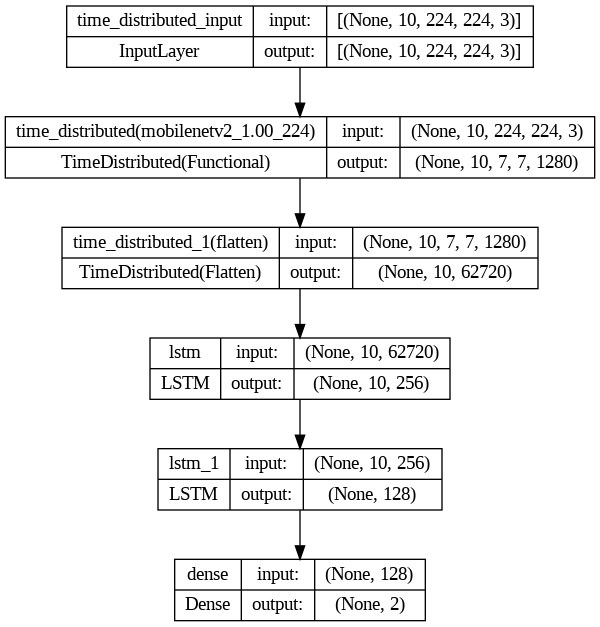

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_architecture.png', show_shapes=True)

In [ ]:
import numpy as np

# Convert images to numpy arrays
train_data = np.array([np.array(img) for img in train_images])
val_data = np.array([np.array(img) for img in val_images])
test_data = np.array([np.array(img) for img in test_images])

# Assuming train_gaze and val_gaze are the corresponding gaze direction labels for training and validation sets
# Convert gaze directions to numpy arrays
train_labels = np.array(train_gaze)
val_labels = np.array(val_gaze)

# Reshape the data to fit the input shape of the model
train_data = train_data.reshape((-1, sequence_length, *input_shape))
val_data = val_data.reshape((-1, sequence_length, *input_shape))

# Train the model
model.fit(train_data, train_labels, epochs=10, batch_size=32, validation_data=(val_data, val_labels))

# Evaluate the model on the test set
test_data = np.array([np.array(img) for img in test_images])
test_data = test_data.reshape((-1, sequence_length, *input_shape))
test_loss = model.evaluate(test_data, test_labels)

print("Test Loss:", test_loss)


In [ ]:
import numpy as np

def data_generator(image_list, label_list, sequence_length, batch_size):
    while True:
        # Create empty arrays to contain batch of sequences
        batch_images = np.zeros((batch_size, sequence_length, 224, 224, 3))
        batch_labels = np.zeros((batch_size, sequence_length, 2))  # Assuming labels are 2D vectors

        for i in range(batch_size):
            # Choose random index in features
            index = np.random.choice(len(image_list) - sequence_length, 1)[0]

            batch_images[i] = np.array(image_list[index : index + sequence_length])
            batch_labels[i] = np.array(label_list[index : index + sequence_length])

        yield batch_images, batch_labels


In [ ]:
from sklearn.model_selection import train_test_split

# Split the labels into training, validation, and test sets
train_labels, temp_labels = train_test_split(all_labels, test_size=0.2, random_state=42)
val_labels, test_labels = train_test_split(temp_labels, test_size=0.5, random_state=42)


ValueError: ignored

In [ ]:
import scipy.io
import os

BASE_PATH_NORMALIZED = "/content/MPIIGaze/Data/Normalized"
all_labels = []

participants = ['p{:02d}'.format(i) for i in range(15)]  # ['p00', 'p01', ..., 'p14']

for participant in participants:
    participant_path = os.path.join(BASE_PATH_NORMALIZED, participant)

    # Get all 'day' folders for the participant
    day_folders = [d for d in os.listdir(participant_path) if d.startswith('day')]

    for day in day_folders:
        day_path = os.path.join(participant_path, day)

        # Load the .mat file for the day
        mat_file_path = os.path.join(day_path, f"{day}.mat")
        if os.path.exists(mat_file_path):
            mat_data = scipy.io.loadmat(mat_file_path)

            # Extract gaze data
            gaze_data = mat_data['data'][0,0]['gaze']

            # Since you're selecting 20% of the images randomly, we need to ensure that the labels correspond to the same images.
            # Shuffle the gaze data using the same random seed and select 20%.
            random.seed(42)  # Ensure reproducibility
            shuffled_gaze_data = list(gaze_data)
            random.shuffle(shuffled_gaze_data)
            selected_gaze_data = shuffled_gaze_data[:int(0.2 * len(shuffled_gaze_data))]

            # Append to the all_labels list
            all_labels.extend(selected_gaze_data)

print(f"Total gaze labels: {len(all_labels)}")


Total gaze labels: 0


In [ ]:
print(type(sample_data['data']))
print(sample_data['data'].shape)
print(sample_data['data'][0,0].dtype)


<class 'numpy.ndarray'>
(1, 1)
[('right', 'O'), ('left', 'O')]


In [ ]:
right_eye_data = sample_data['data'][0,0]['right']
print(type(right_eye_data))
print(right_eye_data.shape)
print(right_eye_data.dtype)


<class 'numpy.ndarray'>
(1, 1)
[('gaze', 'O'), ('image', 'O'), ('pose', 'O')]


In [ ]:
right_gaze_data = right_eye_data[0,0]['gaze']
print(type(right_gaze_data))
print(right_gaze_data.shape)


<class 'numpy.ndarray'>
(995, 3)


In [ ]:
batch_size = 32

# Create generators for training, validation, and test sets
train_gen = data_generator(train_images, train_labels, sequence_length, batch_size)
val_gen = data_generator(val_images, val_labels, sequence_length, batch_size)




NameError: ignored

In [ ]:

# Calculate the number of steps per epoch
train_steps_per_epoch = len(train_images) // batch_size
val_steps_per_epoch = len(val_images) // batch_size

In [ ]:

# Train the model
model.fit(train_gen,
          steps_per_epoch=train_steps_per_epoch,
          validation_data=val_gen,
          validation_steps=val_steps_per_epoch,
          epochs=10)

In [ ]:
# Load a sample .mat file
sample_path = "/content/MPIIGaze/Data/Normalized/p00/day01.mat"
sample_data = scipy.io.loadmat(sample_path)

# Print the keys in the .mat file
print(sample_data.keys())


dict_keys(['__header__', '__version__', '__globals__', 'data', 'filenames'])


In [ ]:
# Inspect the 'data' entry from the sample .mat file
sample_data_content = sample_data['data']

# Print the type and shape (if it's an array) of the 'data' entry
print(type(sample_data_content))
if isinstance(sample_data_content, np.ndarray):
    print(sample_data_content.shape)

# If it's not too large, print the content as well
if hasattr(sample_data_content, 'size') and sample_data_content.size < 50:
    print(sample_data_content)


<class 'numpy.ndarray'>
(1, 1)
[[(array([[(array([[-0.12202543,  0.09011014, -0.98842802],
                 [-0.09933379,  0.21729911, -0.97103754],
                 [-0.15406083,  0.15995623, -0.97502783],
                 ...,
                 [ 0.0823537 ,  0.10323527, -0.99124182],
                 [ 0.17156863,  0.11417502, -0.97853374],
                 [-0.21271785,  0.23641129, -0.94808271]]), array([[[198, 210, 222, ...,  96, 102, 110],
                  [210, 225, 238, ..., 110, 117, 120],
                  [223, 232, 245, ..., 115, 123, 128],
                  ...,
                  [234, 230, 232, ..., 249, 250, 250],
                  [240, 237, 242, ..., 249, 249, 249],
                  [247, 246, 249, ..., 249, 248, 249]],

                 [[240, 245, 247, ...,  92, 100, 106],
                  [242, 246, 246, ...,  95, 100, 110],
                  [241, 245, 243, ..., 100, 103, 106],
                  ...,
                  [254, 254, 253, ..., 253, 254, 252],
       

In [ ]:
# Split the labels into training, validation, and test sets
train_labels, temp_labels = train_test_split(all_labels, test_size=0.2, random_state=42)
val_labels, test_labels = train_test_split(temp_labels, test_size=0.5, random_state=42)


ValueError: ignored

In [ ]:
all_labels = []

for participant in participants:
    participant_path = os.path.join(BASE_PATH_NORMALIZED, participant)

    # Get all 'day' folders for the participant
    day_folders = [d for d in os.listdir(participant_path) if d.startswith('day')]

    for day in day_folders:
        day_path = os.path.join(participant_path, day)

        # Load the .mat file for the day
        mat_file_path = os.path.join(day_path, f"{day}.mat")
        if os.path.exists(mat_file_path):
            mat_data = scipy.io.loadmat(mat_file_path)

            # Extract gaze directions from the 'data' entry
            gaze_directions = mat_data['data'][0, 0][0]

            # Since you're selecting 20% of the images randomly, we need to ensure that the labels correspond to the same images.
            # Shuffle the gaze directions using the same random seed and select 20%.
            random.seed(42)  # Ensure reproducibility
            random.shuffle(gaze_directions)
            selected_gaze_directions = gaze_directions[:int(0.2 * len(gaze_directions))]

            # Append to the all_labels list
            all_labels.extend(selected_gaze_directions)


In [ ]:
from sklearn.model_selection import train_test_split

# Split the labels into training, validation, and test sets
train_labels, temp_labels = train_test_split(all_labels, test_size=0.2, random_state=42)
val_labels, test_labels = train_test_split(temp_labels, test_size=0.5, random_state=42)


ValueError: ignored

In [ ]:
print(len(all_labels))

0


In [ ]:
def sequence_generator(image_list, label_list, sequence_length, batch_size):
    while True:
        for i in range(0, len(image_list) - sequence_length + 1 - batch_size, batch_size):
            image_sequences = [image_list[j:j+sequence_length] for j in range(i, i+batch_size)]
            label_sequences = [label_list[j:j+sequence_length] for j in range(i, i+batch_size)]

            image_batch = np.array(image_sequences)
            label_batch = np.array(label_sequences)

            yield image_batch, label_batch

# Define batch size and sequence length
batch_size = 32
sequence_length = 10

# Create generators for training, validation, and test sets
train_gen = sequence_generator(train_images, train_labels, sequence_length, batch_size)
val_gen = sequence_generator(val_images, val_labels, sequence_length, batch_size)
test_gen = sequence_generator(test_images, test_labels, sequence_length, batch_size)

# Calculate steps per epoch for training and validation
train_steps = len(train_images) // batch_size
val_steps = len(val_images) // batch_size


NameError: ignored